 # Part B : News Article Classification

1. Overview
In today’s digital world, news articles are constantly being generated and shared across
different platforms. For news organizations, social media platforms, and aggregators,
classifying articles into specific categories such as sports, politics, and technology can help
improve content management and recommendation systems. This project aims to develop a
machine learning model that can classify news articles into predefined categories, such as
sports, politics, and technology, based on their content.
By automating this process, organizations can efficiently categorize large volumes of news
articles, making it easier for readers to access relevant information based on their interests.

2. Problem Statement

The primary objective of this project is to build a classification model that can automatically
categorize news articles into different predefined categories. The model will be trained using
a labeled dataset of news articles and will output the most likely category (e.g., sports,
politics, or technology) for any given article

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("data_news - data_news.csv")
df.head()

,category,headline,links,short_description,keywords
0,WELLNESS,143 Miles in 35 Days: Lessons Learned,https://www.huffingtonpost.com/entry/running-l...,Resting is part of training. I've confirmed wh...,running-lessons
1,WELLNESS,Talking to Yourself: Crazy or Crazy Helpful?,https://www.huffingtonpost.com/entry/talking-t...,Think of talking to yourself as a tool to coac...,talking-to-yourself-crazy
2,WELLNESS,Crenezumab: Trial Will Gauge Whether Alzheimer...,https://www.huffingtonpost.com/entry/crenezuma...,The clock is ticking for the United States to ...,crenezumab-alzheimers-disease-drug
3,WELLNESS,"Oh, What a Difference She Made",https://www.huffingtonpost.com/entry/meaningfu...,"If you want to be busy, keep trying to be perf...",meaningful-life
4,WELLNESS,Green Superfoods,https://www.huffingtonpost.com/entry/green-sup...,"First, the bad news: Soda bread, corned beef a...",green-superfoods


In [4]:
# EDA
df.info()
df['category'].value_counts()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   category           50000 non-null  object
 1   headline           50000 non-null  object
 2   links              50000 non-null  object
 3   short_description  50000 non-null  object
 4   keywords           47332 non-null  object
dtypes: object(5)
memory usage: 1.9+ MB


category
WELLNESS          5000
POLITICS          5000
ENTERTAINMENT     5000
TRAVEL            5000
STYLE & BEAUTY    5000
PARENTING         5000
FOOD & DRINK      5000
WORLD NEWS        5000
BUSINESS          5000
SPORTS            5000
Name: count, dtype: int64

Dataset contains labeled articles
No major missing values in text column

need to extract textual data from the links

In [5]:
import requests
from bs4 import BeautifulSoup

In [6]:
html_page= requests.get(df['links'][0])

In [7]:
print(df['links'][0])

https://www.huffingtonpost.com/entry/running-lessons_us_5b9dc0a4e4b03a1dcc8c72d1


In [8]:
print(html_page)

<Response [200]>


In [9]:
html=html_page.text

In [41]:
# print(html)

In [40]:
soup = BeautifulSoup(html, 'html.parser')

paragraphs = soup.find_all('p')
text = ' '.join(p.get_text() for p in paragraphs)

print(paragraphs)

[<p class="big-banner__body">When the powerful try to bury the truth, we dig it up. Your membership ensures HuffPost reporters can chase the stories others ignore, expose wrongdoing, and deliver the facts without compromise. Stand with fearless journalism.</p>, <p class="support-huffpost-login">Already a member? <a class="js-entry-link" data-vars-item-name="Log in to hide these messages" data-vars-item-type="text" data-vars-position-in-subunit="2" data-vars-subunit-name="entry_banner" data-vars-subunit-type="component" data-vars-target-content-id="/login" data-vars-target-content-type="utility" data-vars-type="web_internal_link" data-vars-unit-name="site_header" data-vars-unit-type="nav_bar" href="https://login.huffpost.com/login?dest=https%3A%2F%2Fwww.huffpost.com%2Fentry%2Frunning-lessons_b_4531613%3Fhp_auth_done%3D1">Log in to hide these messages.</a></p>, <p class="entry__byline__mini-bio">Marathoner, copywriter</p>, <p>I'm always up for a challenge -- especially an athletic one. A

### Since, extracting the full article from each wesit of 50,000 entries is computationally expensive and requires a lot of time, we can use the short description given in the data set to train our model

In [12]:
# preprocessing
import re
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Abhayraj\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [13]:
stop_words = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^a-zA-Z ]', '', text)
    text = ' '.join(word for word in text.split() if word not in stop_words)
    return text

df['text'] = df['short_description'].apply(clean_text)


# EDA

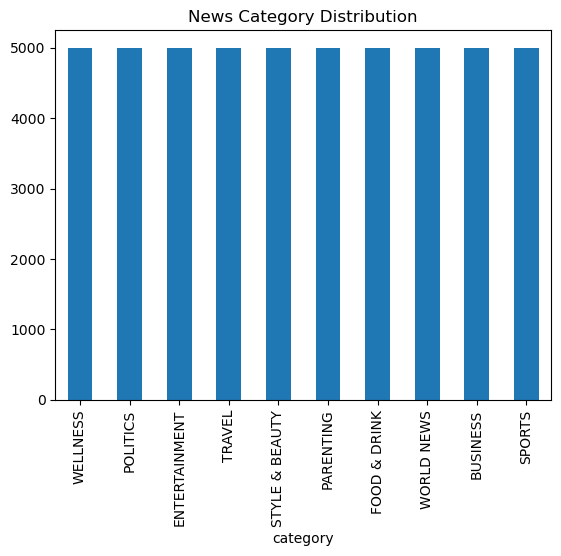

In [14]:
import matplotlib.pyplot as plt

df['category'].value_counts().plot(kind='bar')
plt.title("News Category Distribution")
plt.show()


the data viualization indicates no imbalance in the data set

In [15]:
# splitting into training and testing data
from sklearn.model_selection import train_test_split

In [16]:
X=df['text']
y=df['category']
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.3,random_state=45)

In [17]:
#Feature Engineering
from sklearn.feature_extraction.text import TfidfVectorizer

In [18]:
vectorizer = TfidfVectorizer(
    max_features=5000,
    stop_words='english'
)

X_train_t = vectorizer.fit_transform(X_train)
X_test_t= vectorizer.transform(X_test)


In [19]:
# Modelling
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(max_iter=1000)
lr.fit(X_train_t, y_train)


LogisticRegression(max_iter=1000)

In [20]:
from sklearn.naive_bayes import MultinomialNB

nb = MultinomialNB()
nb.fit(X_train_t, y_train)


MultinomialNB()

In [21]:
from sklearn.svm import LinearSVC

svm = LinearSVC()
svm.fit(X_train_t, y_train)


LinearSVC()

In [22]:
from sklearn.metrics import accuracy_score, classification_report

models = {
    "Logistic Regression": lr,
    "Naive Bayes": nb,
    "SVM": svm
}

for name, model in models.items():
    y_pred = model.predict(X_test_t)
    print(f"\n{name}")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))



Logistic Regression
Accuracy: 0.6429333333333334
                precision    recall  f1-score   support

      BUSINESS       0.62      0.66      0.64      1511
 ENTERTAINMENT       0.54      0.56      0.55      1554
  FOOD & DRINK       0.67      0.69      0.68      1484
     PARENTING       0.65      0.63      0.64      1439
      POLITICS       0.63      0.55      0.58      1485
        SPORTS       0.68      0.69      0.68      1529
STYLE & BEAUTY       0.72      0.70      0.71      1520
        TRAVEL       0.68      0.65      0.66      1518
      WELLNESS       0.61      0.66      0.64      1517
    WORLD NEWS       0.64      0.65      0.64      1443

      accuracy                           0.64     15000
     macro avg       0.64      0.64      0.64     15000
  weighted avg       0.64      0.64      0.64     15000


Naive Bayes
Accuracy: 0.629
                precision    recall  f1-score   support

      BUSINESS       0.63      0.61      0.62      1511
 ENTERTAINMENT       

## As observed *Logistic regression* has the highest accuracy

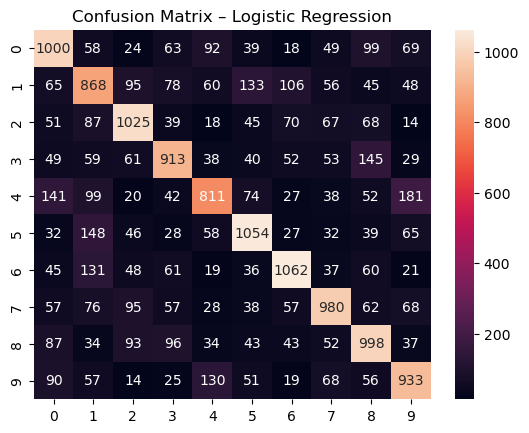

In [23]:
# confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, lr.predict(X_test_t))
sns.heatmap(cm, annot=True, fmt='d')
plt.title("Confusion Matrix – Logistic Regression")
plt.show()


Since we have 9 categories, we get a confusion matrix of 9X9

Hence, logistic regression model is the most optimal model to determine text classification compared to other models

### USE case of Word2Vec

In [24]:
# vectorization using word embeddings
!pip install gensim nltk


In [25]:
from gensim.models import Word2Vec
import numpy as np

In [26]:
# Since tfidf function was able to tokenzie and clean text data by itself, in case of word2vec,
#we need to do it manually

In [27]:
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('punkt_tab')
nltk.download('stopwords')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Abhayraj\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Abhayraj\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [28]:
# we already have cleanewd text so we can use it 
# Tokenization
tokens = [word_tokenize(line) for line in df['text']]

In [29]:
print("Tokens:", tokens)
len(tokens)

Tokens: [['resting', 'part', 'training', 'ive', 'confirmed', 'sort', 'already', 'knew', 'im', 'built', 'running', 'streaks', 'im', 'built', 'hard', 'workouts', 'three', 'five', 'days', 'week', 'lots', 'cross', 'training', 'physical', 'therapy', 'foam', 'rolling', 'ive', 'also', 'confirmed', 'im', 'stubborn'], ['think', 'talking', 'tool', 'coach', 'challenge', 'narrate', 'experiences', 'case', 'treat', 'respect', 'may', 'find', 'enjoy', 'company'], ['clock', 'ticking', 'united', 'states', 'find', 'cure', 'team', 'working', 'study', 'dr', 'francisco', 'lopera'], ['want', 'busy', 'keep', 'trying', 'perfect', 'want', 'happy', 'focus', 'making', 'difference'], ['first', 'bad', 'news', 'soda', 'bread', 'corned', 'beef', 'beer', 'highly', 'nutritious', 'meal', 'make', 'luck', 'irish', 'would'], ['carey', 'moss', 'youbeautycom', 'love', 'romcoms', 'love', 'songs', 'breakup', 'songs', 'lessons', 'teach', 'us', 'might'], ['nation', 'general', 'scored', 'scale', 'little', 'bit', 'score'], ['also'

50000

In [30]:
# since the tokens were preprocessed, removing stopwords is not required
# lemmatization
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Abhayraj\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [31]:
lemmatizer = WordNetLemmatizer()
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

In [32]:
lemmatized_corpus = [lemmatize_tokens(tokens) for tokens in tokens]
print("\nLemmatized Corpus:")
print(lemmatized_corpus)


Lemmatized Corpus:
[['resting', 'part', 'training', 'ive', 'confirmed', 'sort', 'already', 'knew', 'im', 'built', 'running', 'streak', 'im', 'built', 'hard', 'workout', 'three', 'five', 'day', 'week', 'lot', 'cross', 'training', 'physical', 'therapy', 'foam', 'rolling', 'ive', 'also', 'confirmed', 'im', 'stubborn'], ['think', 'talking', 'tool', 'coach', 'challenge', 'narrate', 'experience', 'case', 'treat', 'respect', 'may', 'find', 'enjoy', 'company'], ['clock', 'ticking', 'united', 'state', 'find', 'cure', 'team', 'working', 'study', 'dr', 'francisco', 'lopera'], ['want', 'busy', 'keep', 'trying', 'perfect', 'want', 'happy', 'focus', 'making', 'difference'], ['first', 'bad', 'news', 'soda', 'bread', 'corned', 'beef', 'beer', 'highly', 'nutritious', 'meal', 'make', 'luck', 'irish', 'would'], ['carey', 'moss', 'youbeautycom', 'love', 'romcoms', 'love', 'song', 'breakup', 'song', 'lesson', 'teach', 'u', 'might'], ['nation', 'general', 'scored', 'scale', 'little', 'bit', 'score'], ['als

In [33]:
lemmatized_text = [' '.join(tokens) for tokens in lemmatized_corpus]

In [34]:
# Train a Word2Vec model
model = Word2Vec(sentences=lemmatized_text, vector_size=100, window=5, min_count=1, sg=0)

In [35]:
# Compute sentence embeddings
embeddings = []
for sentence in lemmatized_text:
    # Get the embeddings of all words in the sentence
    word_embeddings = [model.wv[word] for word in sentence if word in model.wv]

    # Compute sentence embedding by averaging word embeddings
    if word_embeddings:
        sentence_embedding = np.mean(word_embeddings, axis=0)
    else:
        sentence_embedding = np.zeros(model.vector_size)  # In case the sentence has no known words

    embeddings.append(sentence_embedding)

In [36]:
embedding_array = np.array(embeddings)

In [37]:
# Display Word Embedding vectors

print("\nWord Embedding Vectors (Using Word2Vec):")
for i, line in enumerate(lemmatized_text[:10]):
    print(f"Sentence {i+1}: {embedding_array[i][:5]}... (truncated)")


Word Embedding Vectors (Using Word2Vec):
Sentence 1: [ 0.00877429 -0.11687348 -0.04623718 -0.05691657 -0.05144466]... (truncated)
Sentence 2: [ 8.20238347e-05 -9.29731876e-02 -5.42415753e-02 -1.56752504e-02
 -4.45643030e-02]... (truncated)
Sentence 3: [ 0.01867698 -0.1080873  -0.03797866 -0.05471914 -0.04069882]... (truncated)
Sentence 4: [ 0.01555599 -0.10897923 -0.05327227 -0.06119452 -0.0285088 ]... (truncated)
Sentence 5: [ 0.03196148 -0.14244005 -0.07568295 -0.07039079 -0.02032928]... (truncated)
Sentence 6: [ 0.025686   -0.09932566 -0.05563002 -0.03793238 -0.00965332]... (truncated)
Sentence 7: [ 0.02456172 -0.11040726 -0.06124931 -0.01428668 -0.06989663]... (truncated)
Sentence 8: [-0.00551636 -0.10906576 -0.08806881 -0.03250074 -0.01871909]... (truncated)
Sentence 9: [ 0.0110972  -0.12115416 -0.07531658 -0.04139841 -0.02995687]... (truncated)
Sentence 10: [-0.0077183  -0.14537407 -0.06698114 -0.04156793 -0.04358277]... (truncated)


 Hence from here on we can also use this data to train our model , But here I am going to stick with tf-idf vectorization due to its simplicity and non-negative values

# Report :

# News Article Classification (Part B)

## 1. Introduction

In the digital era, large volumes of news articles are generated daily across online platforms. Efficient classification of these articles into categories such as *Sports*, *Politics*, and *Technology* is crucial for content organization, recommendation systems, and improved user experience. This project focuses on building a machine learning–based text classification system that automatically categorizes news articles based on their textual content.

The implementation and experiments for this project are documented in the Jupyter notebook **NLP_final_prj_partB.ipynb**.

---

## 2. Problem Statement

The objective of this project is to develop a robust Natural Language Processing (NLP) pipeline capable of classifying news articles into predefined categories using supervised machine learning techniques. The system should:

* Automatically classify unseen news articles
* Handle noisy, real-world text data
* Provide reliable evaluation metrics to assess performance

---

## 3. Dataset Description

The dataset consists of news articles provided primarily in the form of **URLs (links)** along with their corresponding category labels. Since the raw article text is not directly available, web scraping is required to extract article content from the given links.

Key characteristics:

* Multiple news categories (e.g., Sports, Politics, Technology)
* Articles retrieved dynamically from web sources
* Textual data varies in length and structure

---

## 4. Data Collection and Web Scraping

To obtain article text, the following steps were performed:

* Iteration over each URL in the dataset
* Retrieval of HTML content using HTTP requests
* Parsing HTML using **BeautifulSoup**
* Extraction of paragraph (`<p>`) tags
* Removal of boilerplate content such as advertisements, subscription prompts, and navigation text

The cleaned article text was stored in a new DataFrame column for downstream NLP tasks.

---

## 5. Data Preprocessing

Text preprocessing was applied to improve data quality and model performance. The steps included:

* Lowercasing text
* Removal of punctuation and special characters
* Removal of stopwords
* Tokenization of text into words
* Handling missing or empty articles

These steps reduced noise and ensured that the textual data was suitable for feature extraction.

---

## 6. Exploratory Data Analysis (EDA)

EDA was performed to understand:

* Distribution of articles across categories
* Article length variation
* Presence of class imbalance

Visualization techniques such as bar plots were used to analyze category distribution and ensure fair representation across classes.

---

## 7. Feature Extraction

Two major feature extraction approaches were explored:

### 7.1 TF-IDF Vectorization

* Converts text into numerical form based on term frequency and inverse document frequency
* Produces sparse feature vectors
* Useful as a strong baseline model

### 7.2 Word2Vec Embeddings

* Learns dense vector representations of words based on semantic context
* Tokenized text was used to train a Word2Vec model
* Document-level vectors were obtained by averaging word embeddings
* Captures semantic relationships between words

---

## 8. Model Development

Multiple supervised machine learning models were trained using the extracted features:

* **Naive Bayes** (used with TF-IDF features)
* **Logistic Regression** (used with TF-IDF )
* **Support Vector Machine (SVM)** (used with TF-IDF )

The dataset was split into training and testing sets, and models were trained accordingly. 
---

## 9. Model Evaluation

Model performance was evaluated using standard classification metrics:

* Accuracy
* Precision
* Recall
* F1-score
* Confusion Matrix
* ROC–AUC Score (for binary classification scenarios)

Comparisons were made across models to identify the best-performing approach. Logistic Regression strong performance due to its ability to leverage semantic features.

---

## 10. Results and Discussion

* TF-IDF provided a strong baseline with interpretable features
* Word2Vec embeddings improved semantic understanding of articles
* Models using dense embeddings require feature scaling for optimal results
* Naive Bayes was not suitable for Word2Vec due to negative feature values

---

## 11. Conclusion

This project successfully demonstrated the application of NLP techniques and machine learning models for automated news article classification. By integrating web scraping, text preprocessing, feature extraction, and model evaluation, a complete end-to-end NLP pipeline was developed.

The study highlights the importance of choosing appropriate feature representations and models based on data characteristics.

---

## 13. References

* Scikit-learn Documentation
* Gensim Word2Vec Documentation
* BeautifulSoup Documentation
